# Time-dependent model

Importing libraries:

In [31]:
import torch 
import pandas as pd 
import pickle
import numpy as np
import os
import re
import sys 

from torch.utils.data import Dataset, DataLoader
from torch import nn
import torch.nn.functional as F
import torch.optim as optim


import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from tqdm import trange

sns.set_theme()

Path of data:

In [32]:
path_freq_data = r'..\Results'
path_time_data = r"..\..\..\FLAC2D - Case 1a\data3"

## Data loading and windowing

In [33]:
def extract_info(file_name):
    pattern_Vs = r'Data_(\d+(\.\d+)?)'
    mathes = re.findall(pattern_Vs, file_name)
    return mathes[0][0]

In [34]:
# Load data
files = [f for f in os.listdir(path_time_data) if f.endswith('.csv')]

# Vs values
Vs_array = np.array([float(extract_info(f)) for f in files])

# Only extract info from Vs <= 800
Vs_data = Vs_array[Vs_array <= 800]
files = [f for f in files if float(extract_info(f)) <= 800]

# Extract the acceleration information
Base_accelerations = []
Top_accelerations = []
for i, f in enumerate(files):
    data = pd.read_csv(os.path.join(path_time_data, f))
    if i == 0:
        time_data = data['0'].values
    
    Base_accelerations.append(data['1'].values)
    Top_accelerations.append(data['2'].values)

# Convert to numpy array
Base_accelerations = np.array(Base_accelerations)
Top_accelerations = np.array(Top_accelerations)

In [35]:
# Export in npy format
np.save("Vs_data.npy", Vs_data)
np.save("time_data.npy", time_data)
np.save("Base_accelerations.npy", Base_accelerations)
np.save("Top_accelerations.npy", Top_accelerations)

In [36]:
# Input signal
freq1 = 1.5
t01 = 2.5
input_signal = (1-2.0*(np.pi*freq1*(time_data-t01))**2)*np.exp(-((np.pi*freq1*(time_data-t01))**2))

# Calculate the derivative of the input signal
d_input_signal = np.gradient(input_signal, time_data[1]-time_data[0])

In [37]:
Base_accelerations.shape, Top_accelerations.shape, time_data.shape, Vs_data.shape

((750, 1500), (750, 1500), (1500,), (750,))

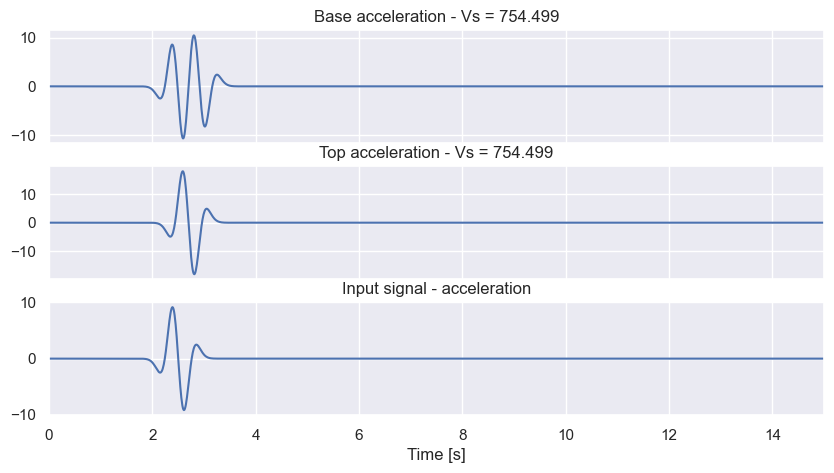

In [38]:
idx = np.random.randint(0, len(Vs_data))


fig, ax = plt.subplots(3,1, figsize=(10,5), sharex=True)
ax[0].plot(time_data, Base_accelerations[idx], label='Base')
ax[1].plot(time_data, Top_accelerations[idx], label='Top')

ax[0].set_title(f'Base acceleration - Vs = {Vs_data[idx]}')
ax[1].set_title(f'Top acceleration - Vs = {Vs_data[idx]}')

ax[2].plot(time_data, d_input_signal, label='Input signal')
ax[2].set_title('Input signal - acceleration')

# X label
ax[2].set_xlabel('Time [s]')

# Set xlim
ax[0].set_xlim([0, 15])

# Show
plt.show()

# Result calculation

In [39]:
import os
import sys

In [40]:
TTF_code_path = "../../../../TF Functions"

# Check files in path
os.listdir(TTF_code_path)

# Add the path to the sys
sys.path.append(TTF_code_path)

In [41]:
from TTF import TTF

In [42]:
# Load testing results
y_test = np.load("y_test.npy")
y_pred = np.load("predictions.npy")
X_test = np.load("X_test.npy")

print(y_test.shape, y_pred.shape, X_test.shape) 

(113, 1500, 2) (113, 1500, 2) (113, 30)


In [43]:
# Compute the rmse error between y_test and y_pred
rmse = []

for i in range(y_test.shape[0]):
    top_rmse = np.sqrt(np.mean((y_test[i,:,0] - y_pred[i,:,0])**2))
    base_rmse = np.sqrt(np.mean((y_test[i,:,1] - y_pred[i,:,1])**2))
    rmse.append([top_rmse, base_rmse])

rmse = np.array(rmse)

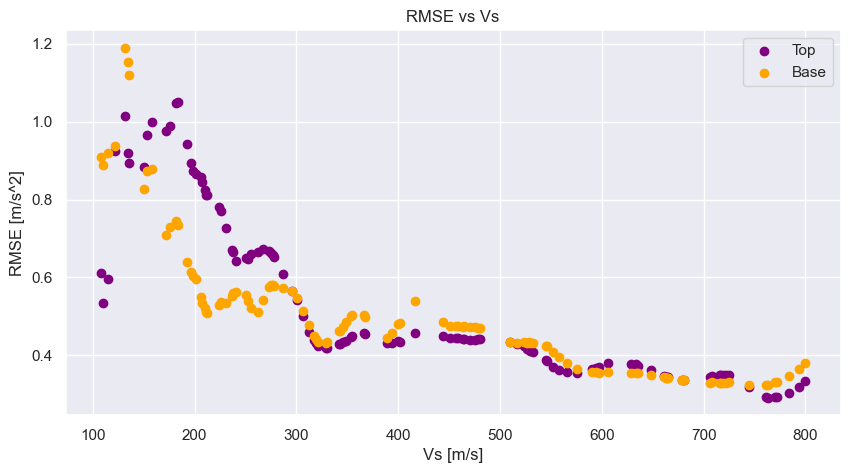

In [44]:
# Plot the rmse top vs Vs
plt.figure(figsize=(10,5))
plt.scatter(X_test[:,0], rmse[:,0], label='Top', color='purple')
plt.scatter(X_test[:,0], rmse[:,1], label='Base', color='orange')
plt.xlabel('Vs [m/s]')
plt.ylabel('RMSE [m/s^2]')
plt.legend()
plt.title('RMSE vs Vs')
plt.show()


Text(0.5, 0, 'Time [s]')

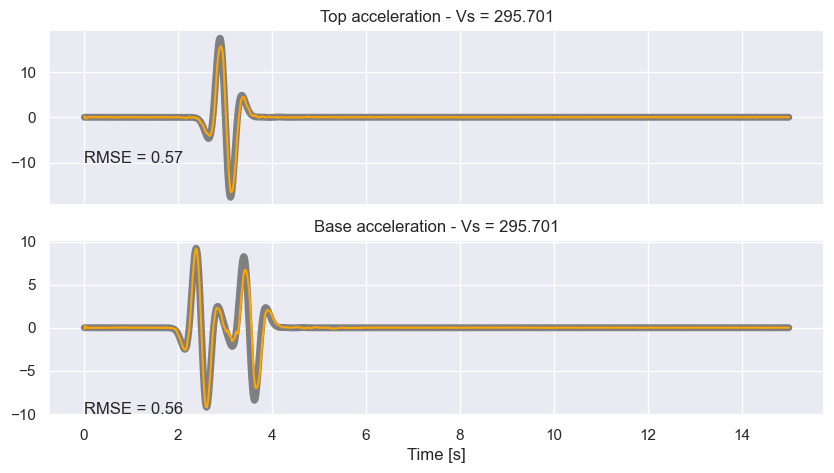

In [45]:
# Plot a random example
idx = np.random.randint(0, len(y_test))

fig, ax = plt.subplots(2,1, figsize=(10,5), sharex=True)
ax[0].plot(time_data, y_test[idx,:,0], label='True', linewidth=5, color='gray')
ax[0].plot(time_data, y_pred[idx,:,0], label='Predicted', color="orange")
ax[0].set_title(f"Top acceleration - Vs = {X_test[idx,0]}")
ax[0].text(0, -10, f"RMSE = {rmse[idx,0]:.2f}")


ax[1].plot(time_data, y_test[idx,:,1], label='True', linewidth=5, color='gray')
ax[1].plot(time_data, y_pred[idx,:,1], label='Predicted', color="orange")
ax[1].set_title(f"Base acceleration - Vs = {X_test[idx,0]}")
ax[1].text(0, -10, f"RMSE = {rmse[idx,1]:.2f}")

ax[1].set_xlabel('Time [s]')


In [46]:
time_data[0]

0.01

In [47]:
y_test.shape

(113, 1500, 2)

In [48]:
# Compute the TF for the true and predicted values
TF_true = []
TF_pred = []

for i in range(len(y_test)):
    freq, tf_true = TTF(y_test[i,:,0], y_test[i,:,1], dt=1e-2)
    freq, tf_pred = TTF(y_pred[i,:,0], y_pred[i,:,1], dt=1e-2)

    TF_true.append(tf_true)
    TF_pred.append(tf_pred)

In [49]:
# Concatenate
TF_true = np.array(TF_true)
TF_pred = np.array(TF_pred)

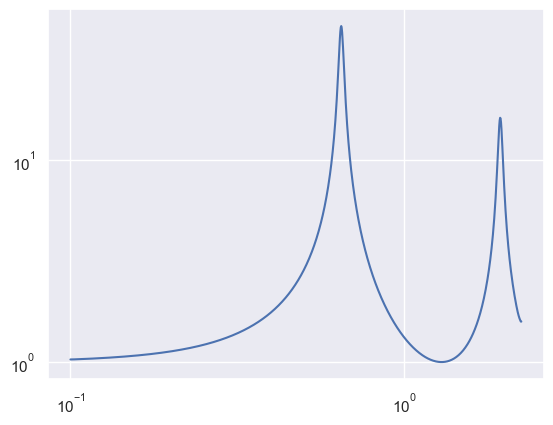

In [50]:
plt.loglog(freq, tf_true, label='True')

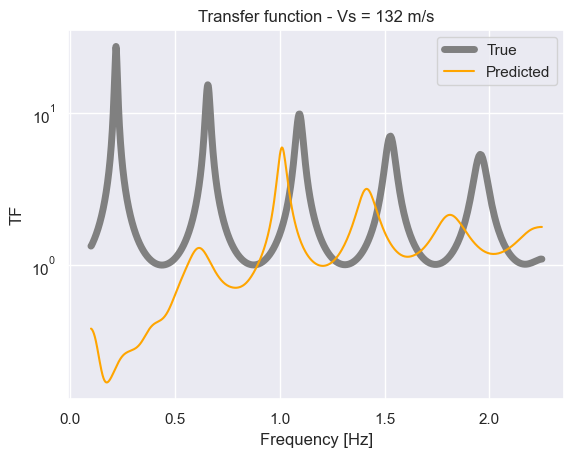

In [51]:
# Plot a random example
idx = np.random.randint(0, len(y_test))

sns.lineplot(x=freq, y=TF_true[idx], label='True', linewidth=5, color='gray')
sns.lineplot(x=freq, y=TF_pred[idx], label='Predicted', color="orange")
plt.title(f"Transfer function - Vs = {X_test[idx,0]:.0f} m/s")
plt.yscale('log')
plt.xlabel('Frequency [Hz]')
plt.ylabel('TF')
plt.show()

In [52]:
# Calculate the correlation between the true and predicted values
from scipy.stats import pearsonr
correlation = np.zeros(len(TF_true))

for i in range(len(TF_true)):
    correlation[i] = pearsonr(TF_true[i], TF_pred[i])[0]


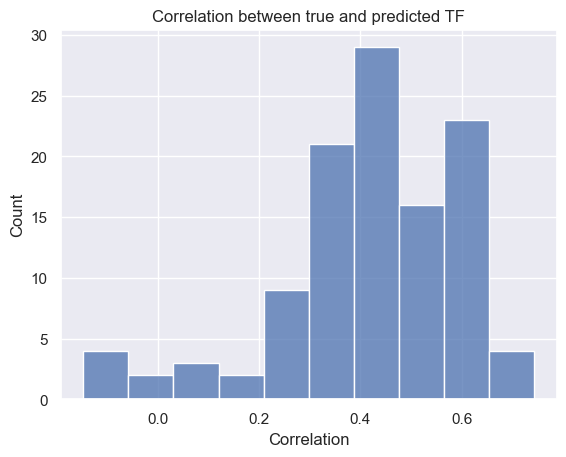

In [53]:
sns.histplot(correlation)
plt.title('Correlation between true and predicted TF')
plt.xlabel('Correlation')
plt.show()

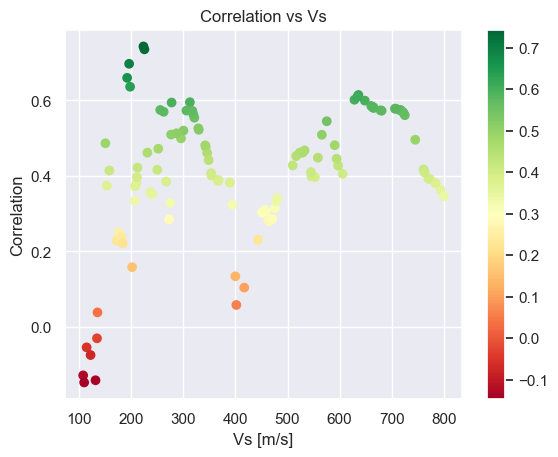

In [54]:
# Plot correlation vs X_test

# Create cmap where red is close to 0 and green is close to 0.8
cmap = sns.color_palette("RdYlGn", as_cmap=True)


plt.scatter(X_test[:,0], correlation, c=correlation, cmap=cmap)
plt.xlabel('Vs [m/s]')
plt.ylabel('Correlation')
plt.title('Correlation vs Vs')
plt.colorbar()
plt.show()

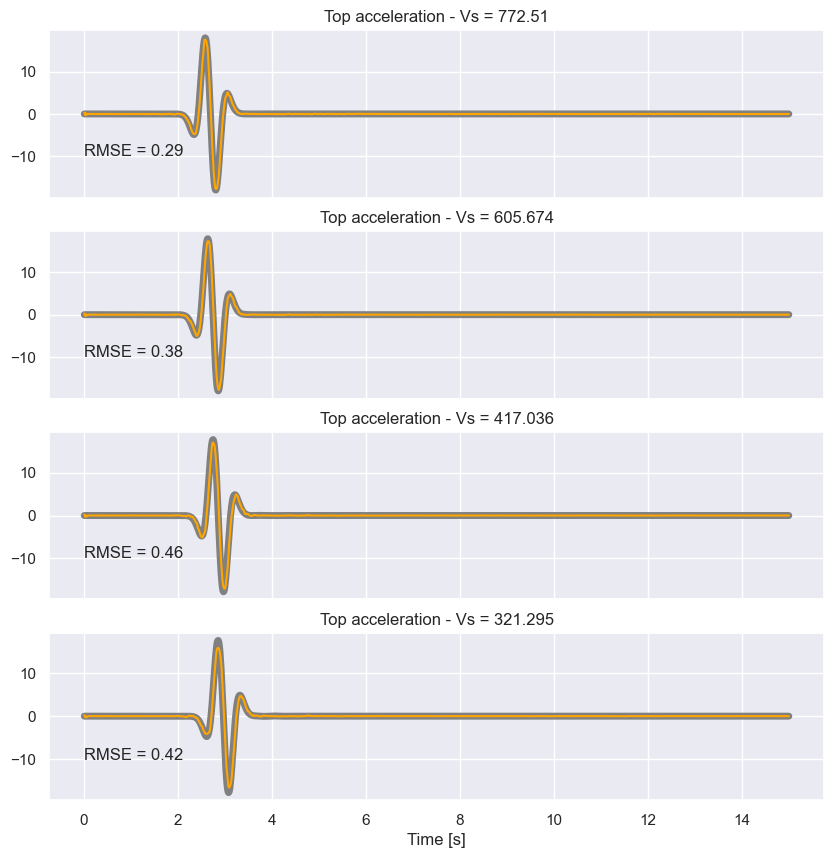

In [57]:
# Plot the first 4 time signals examples
fig, ax = plt.subplots(4,1, figsize=(10,10), sharex=True)

for i in range(4):
    ax[i].plot(time_data, y_test[i,:,0], label='True', linewidth=5, color='gray')
    ax[i].plot(time_data, y_pred[i,:,0], label='Predicted', color="orange")
    ax[i].set_title(f"Top acceleration - Vs = {X_test[i,0]}")
    ax[i].text(0, -10, f"RMSE = {rmse[i,0]:.2f}")

ax[3].set_xlabel('Time [s]')
plt.show()

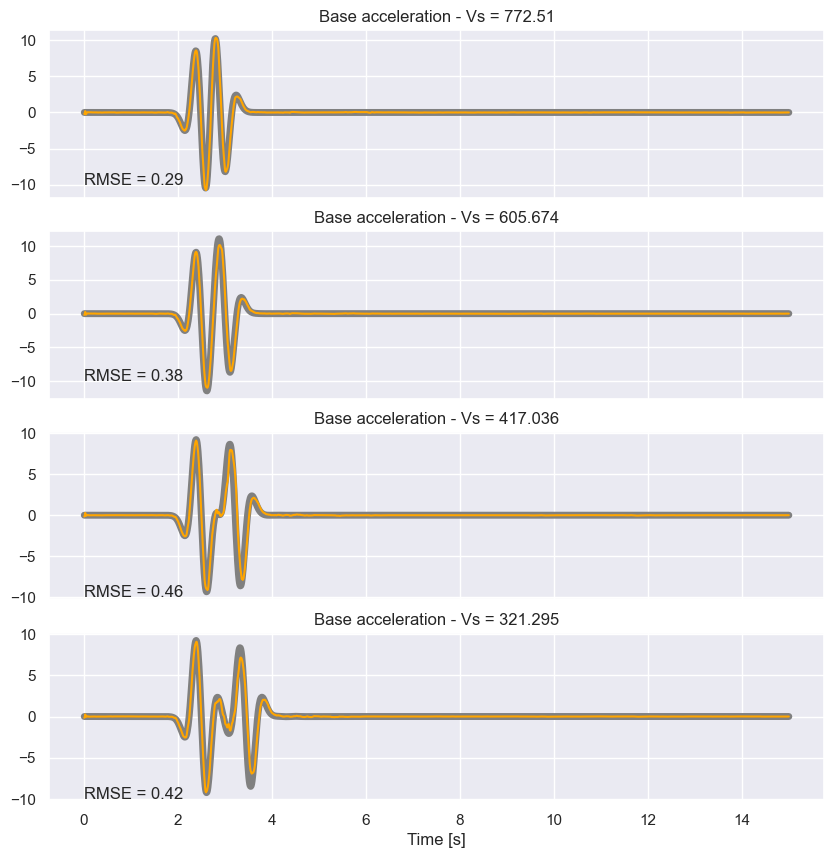

In [58]:
# Plot the first 4 time signals examples
fig, ax = plt.subplots(4,1, figsize=(10,10), sharex=True)

for i in range(4):
    ax[i].plot(time_data, y_test[i,:,1], label='True', linewidth=5, color='gray')
    ax[i].plot(time_data, y_pred[i,:,1], label='Predicted', color="orange")
    ax[i].set_title(f"Base acceleration - Vs = {X_test[i,0]}")
    ax[i].text(0, -10, f"RMSE = {rmse[i,0]:.2f}")

ax[3].set_xlabel('Time [s]')
plt.show()

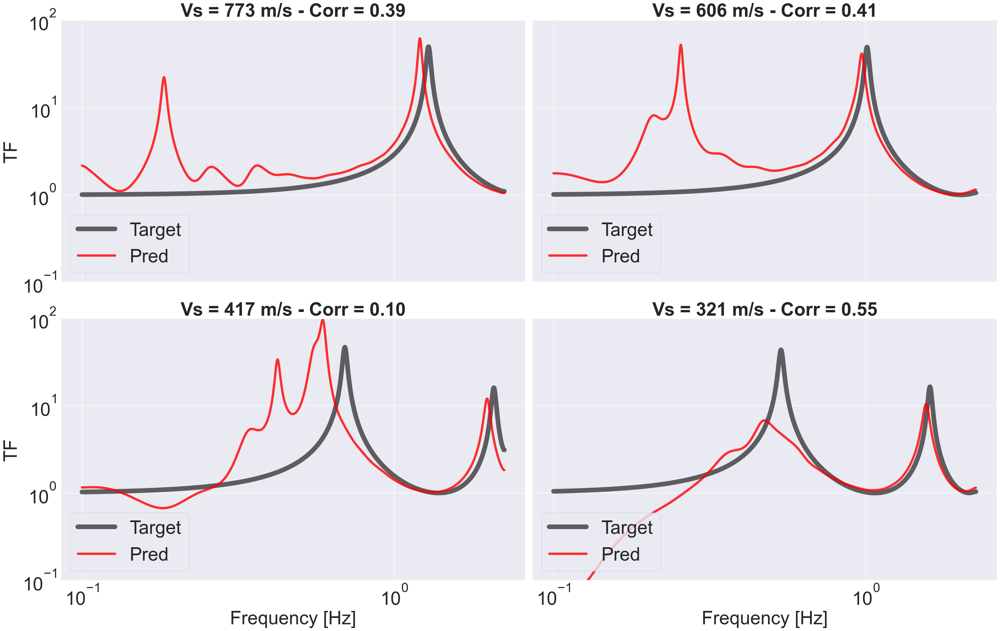

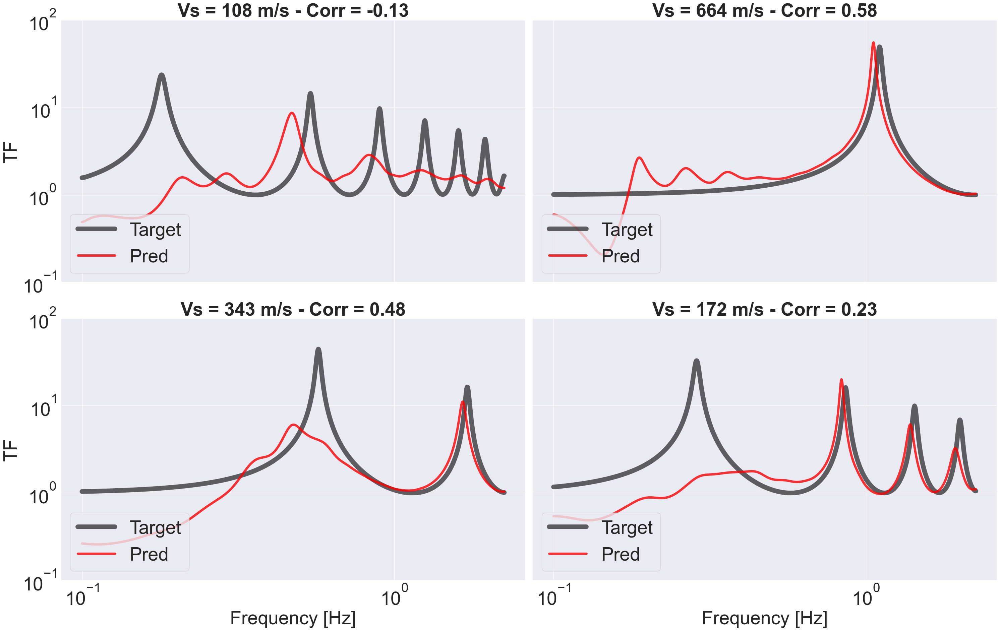

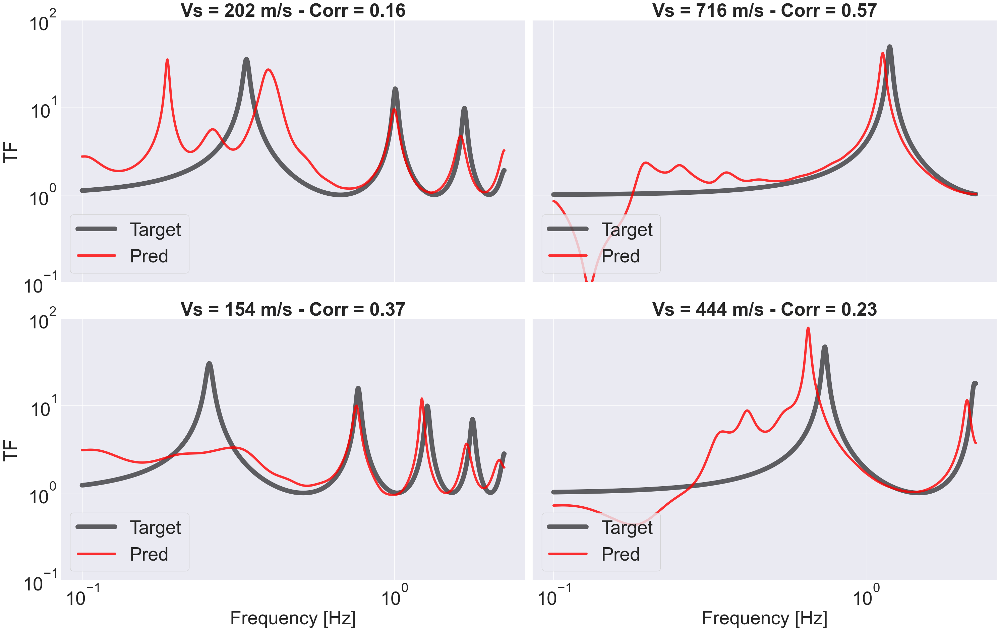

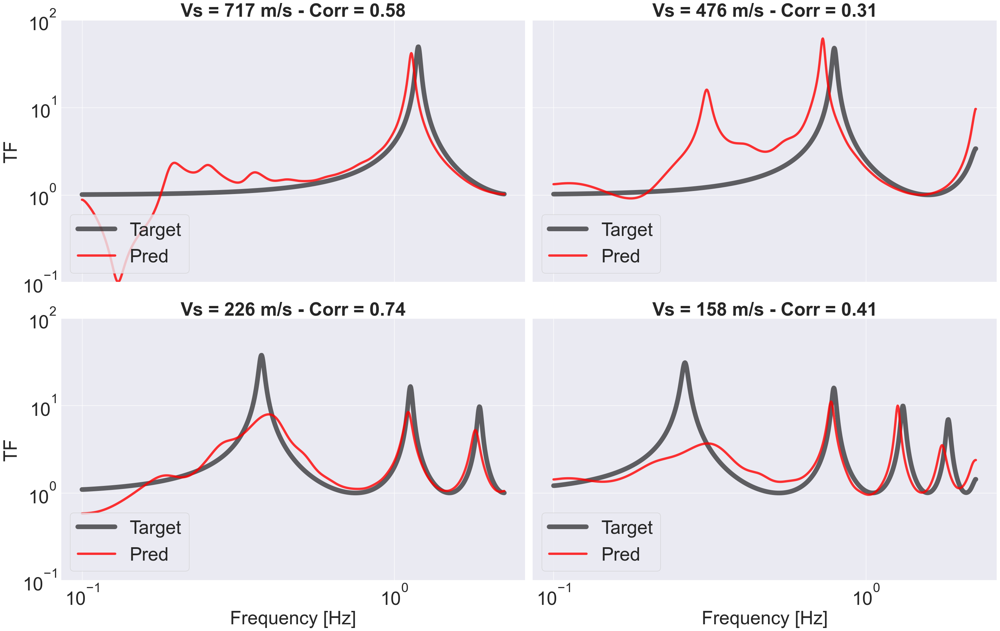

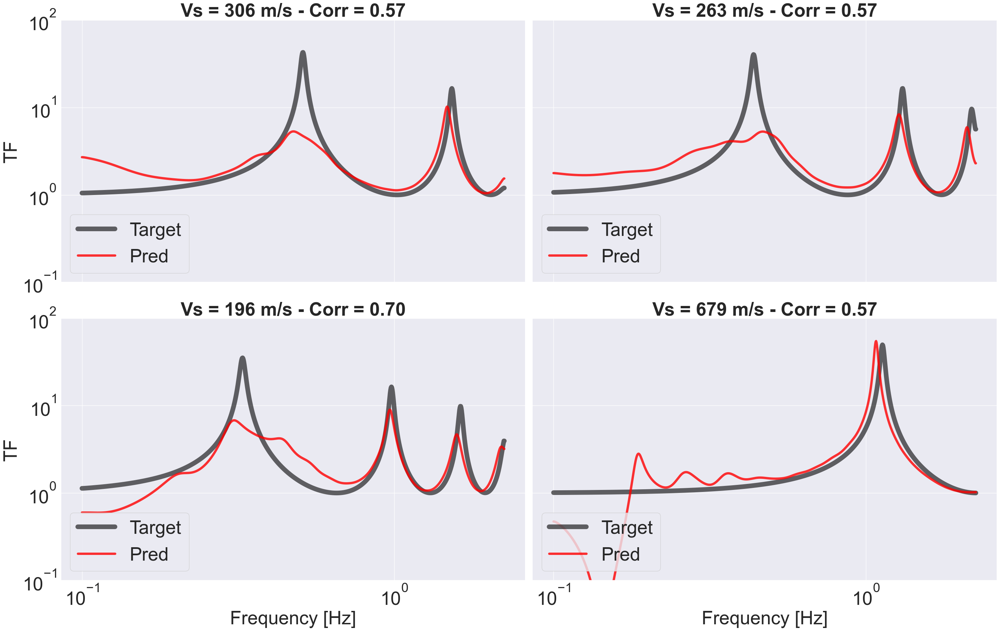

...

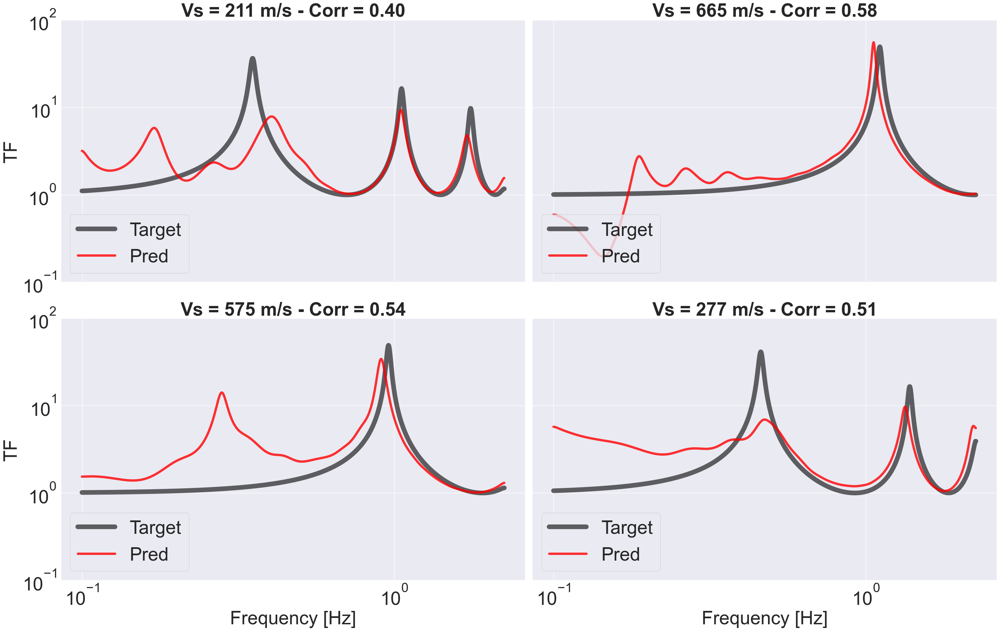

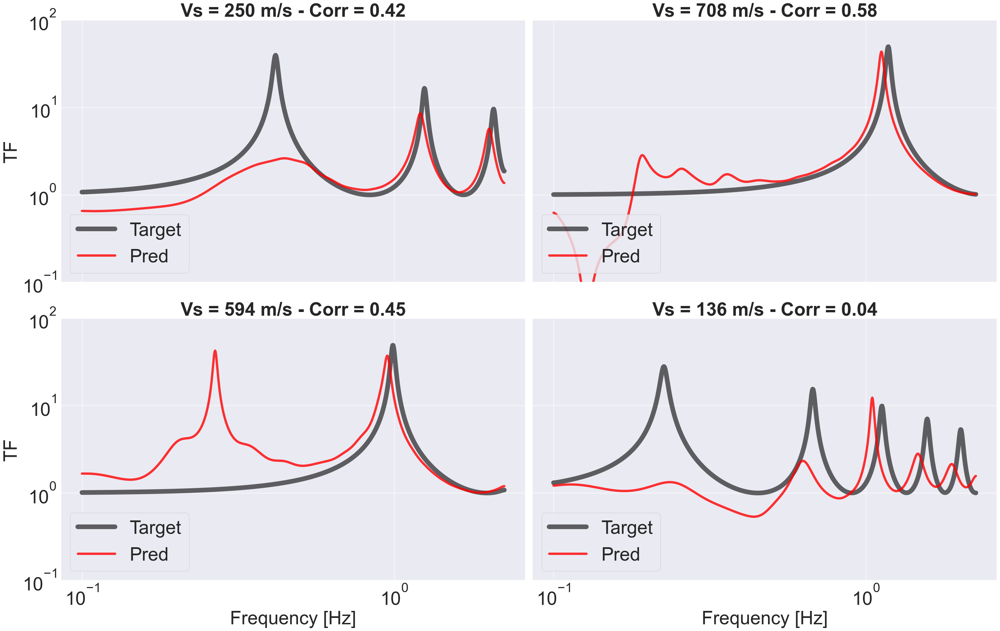

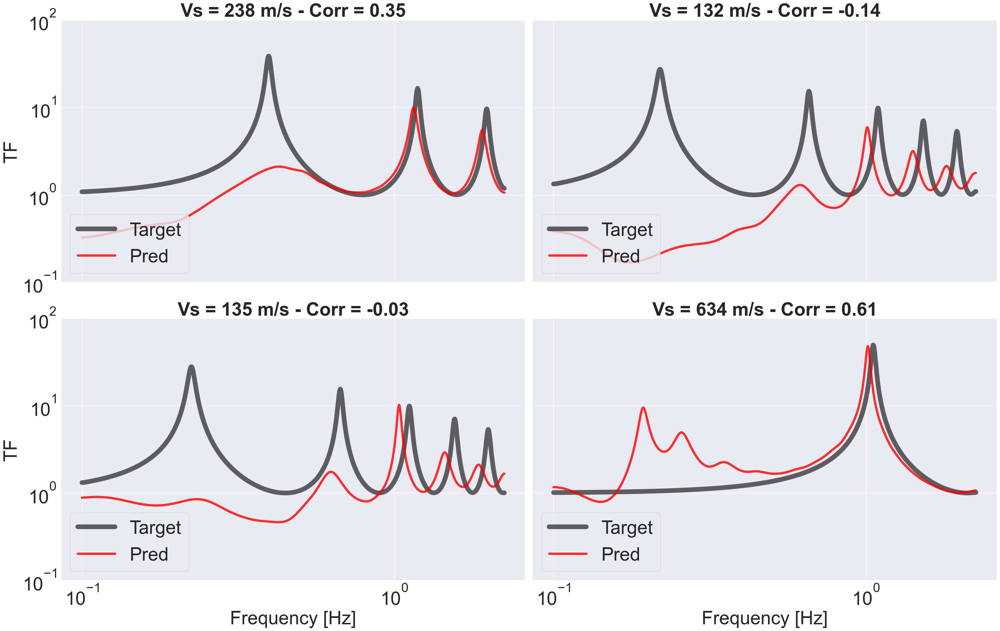

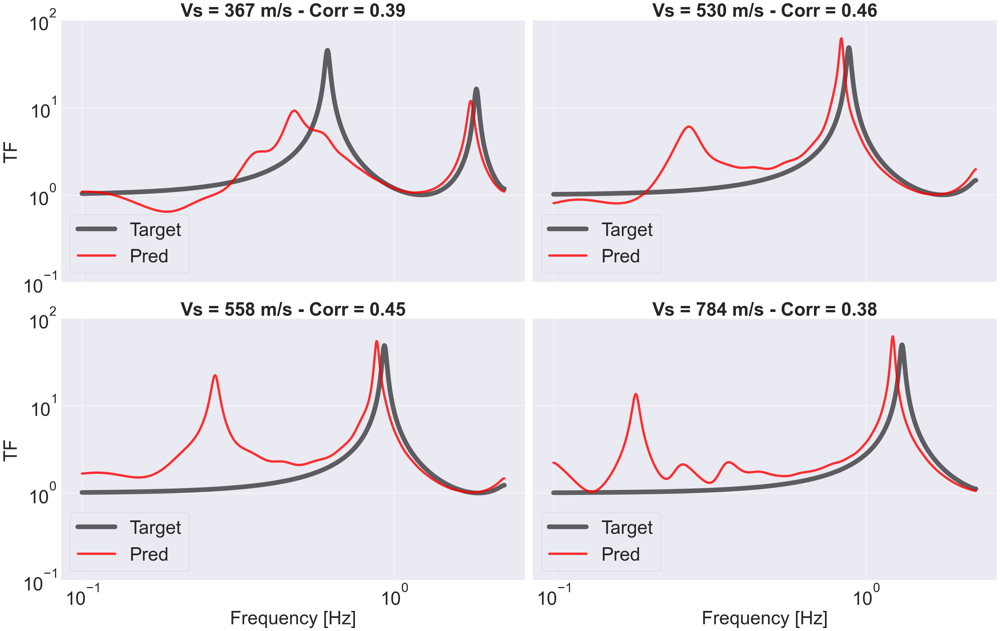

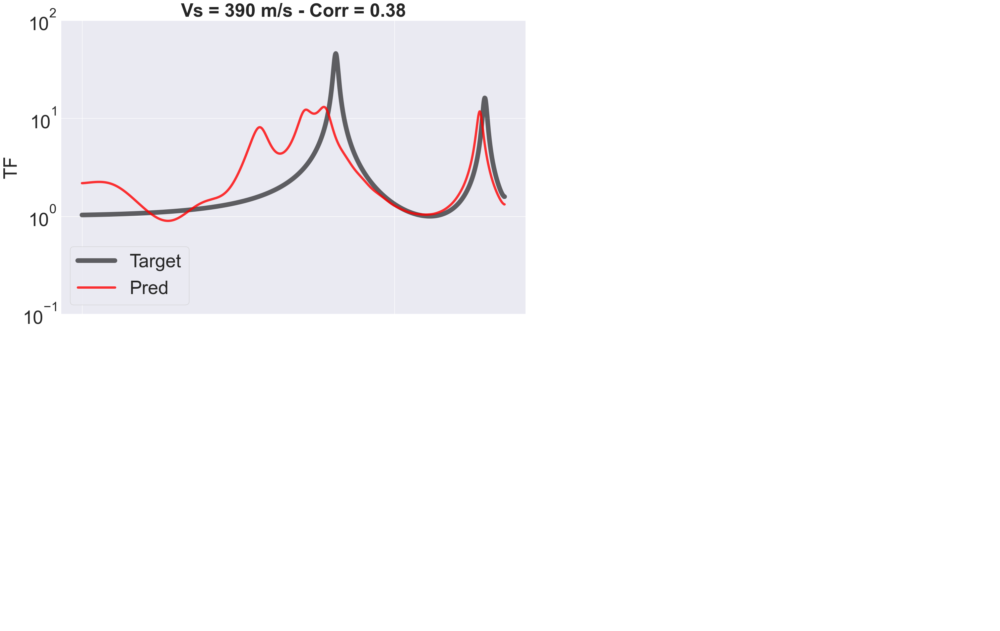

In [56]:
import matplotlib.pyplot as plt

num_plots = X_test.shape[0]
num_rows, num_cols = 2, 2
plots_per_figure = num_rows * num_cols

for k in range(0, num_plots, plots_per_figure):
    fig, ax = plt.subplots(num_rows, num_cols, figsize=(30, 20), sharex=True, sharey=True)
    #fig.suptitle("Comparison of TTF predictions", fontsize=40)

    for i in range(num_rows):
        for j in range(num_cols):
            index = k + i * num_cols + j
            if index >= num_plots:
                ax[i, j].axis('off')  # Turn off the axis if there's no data
                continue
            
            text = f"Vs = {X_test[index,0]:.0f} m/s - Corr = {correlation[index]:.2f}"
            line1, = ax[i, j].loglog(freq, TF_true[index]   , label="Target", linewidth=10, alpha=0.6, color="black")
            line2, = ax[i, j].loglog(freq, TF_pred[index] , label="Pred", linewidth=5, alpha=0.8, color="red")
            ax[i, j].set_title(text, fontweight="bold", fontsize=40)
            ax[i, j].set_ylim([1e-1, 1e2])
            ax[i, j].legend(loc="lower left", fontsize=40)

            # Increase fontsize of ticks
            ax[i, j].tick_params(axis='both', which='major', labelsize=40)

    # Set xlabel and ylabel for the bottom and left subplots
    for i in range(num_rows):
        ax[i, 0].set_ylabel('TF', fontsize=40)
    for j in range(num_cols):
        ax[-1, j].set_xlabel('Frequency [Hz]', fontsize=40)


    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()